Name = Anupam Kasaundhan
Registration No. = 11704492
Section = KM060
Roll No. A07

Diabetic retinopathy is a diabetes complication that affects eyes. 
It's caused by damage to the blood vessels of the light-sensitive tissue at the back of the eye (retina).
At first, diabetic retinopathy may cause no symptoms or only mild vision problems. Eventually, it can cause blindness.
It is important that it is detected in early stage to be fully cured.

To detect it there are many parameters to be judged like:
- Microaneurysms: They are, as the name suggests, small saccular outpouchings that involve capillaries of many vascular districts such as the heart, kidney and eye.
- Exudate: It is any fluid that filters from the circulatory system into lesions or areas of inflammation. 
- Radius of the retina.
- Distance of the anamoly from the center
- Dist Macula - Center



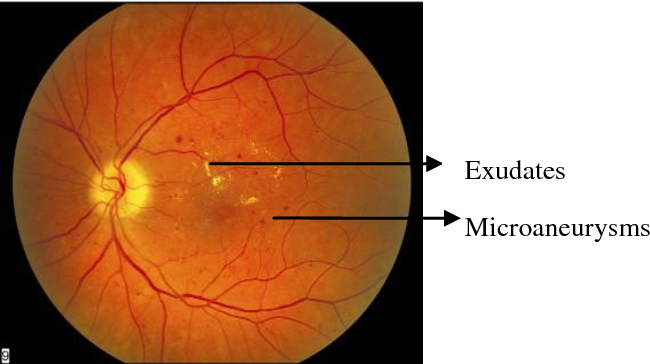

- As seen in figure in the retina thr liquiq portion is the Exudates and the Cappillaries in the Retina is Microaneurysms.


The Project in Detecting Diabetic Retinopathy 
- Datatset Used UCI Machine Learning Repo., Diabetic Retinopathy Debrecen Data Set Data Set
- Dataset Link = http://archive.ics.uci.edu/ml/datasets/Diabetic+Retinopathy+Debrecen+Data+Set#

In [11]:
import numpy as np
import pandas as pd
import keras

Importing Python Libraries...
- numpy - To deal with the high dimensional arrays and functionalities
- pandas - To deal with the dataform importing from the datasets.
- keras - To build our Machine Learning Model.

In [12]:
dataset=pd.read_csv('Fundus_Details.csv')
X=dataset.iloc[:,0:19]
y=dataset.iloc[:,19]

- Importing the datasets from CSV format to pandas dataframe
- Spliting all the dependent and no dependent features in X & Y
- 'X' containg the features and 'Y' target.

In [13]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_sc=sc.fit_transform(X)

- Import StandardScaler from sklearn.preprocessing 
- Fitting and transforming the X into standardised format X_sc
- Standardisation means Xi-mean(X)/std(X)
- We have also tried to train the data with the normalisation and the original   data to but the standardisation gives the best accuracy in this case.


In [14]:
from sklearn.model_selection import train_test_split
X_train_sc,X_test_sc,y_train_sc,y_test_sc=train_test_split(X_sc,y,train_size=0.8,random_state=0)

- Spliting data into training set and  testing set
- Training data = 80%
- Testing data = 20%

In [15]:
from keras.models import Sequential
from keras.layers import Dense

- Dense in keras is used to insert on layer in the model
- Sequential usually refers to the whole model.

In [16]:
network=Sequential()
network.add(Dense(10,kernel_initializer='uniform',activation='relu',input_dim=19))#Input
network.add(Dense(5,kernel_initializer='uniform',activation='relu'))#Hidden
network.add(Dense(1,kernel_initializer='uniform',activation='sigmoid'))#Output
network.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
network.fit(X_train_sc,y_train_sc,batch_size=10,nb_epoch=200)

C:\Anaconda\envs\tensorenv\lib\site-packages\ipykernel_launcher.py:6: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  


Epoch 1/200
920/920 [==============================] - 2s 2ms/step - loss: 0.6911 - acc: 0.5228
Epoch 2/200
920/920 [==============================] - 0s 322us/step - loss: 0.6688 - acc: 0.5228
Epoch 3/200
920/920 [==============================] - 0s 254us/step - loss: 0.6445 - acc: 0.6217
Epoch 4/200
920/920 [==============================] - 0s 356us/step - loss: 0.6274 - acc: 0.6533
Epoch 5/200
920/920 [==============================] - 0s 369us/step - loss: 0.6087 - acc: 0.6630
Epoch 6/200
920/920 [==============================] - 0s 221us/step - loss: 0.5921 - acc: 0.6848
Epoch 7/200
920/920 [==============================] - 0s 315us/step - loss: 0.5789 - acc: 0.6924
Epoch 8/200
920/920 [==============================] - 0s 369us/step - loss: 0.5651 - acc: 0.7076
Epoch 9/200
920/920 [==============================] - 0s 182us/step - loss: 0.5575 - acc: 0.7120
Epoch 10/200
920/920 [==============================] - 0s 268us/step - loss: 0.5480 - acc: 0.7217
Epoch 11/200
920/920 

920/920 [==============================] - 0s 260us/step - loss: 0.4105 - acc: 0.8098
Epoch 165/200
920/920 [==============================] - 0s 199us/step - loss: 0.4123 - acc: 0.8011
Epoch 166/200
920/920 [==============================] - 0s 152us/step - loss: 0.4083 - acc: 0.8130
Epoch 167/200
920/920 [==============================] - 0s 217us/step - loss: 0.4087 - acc: 0.8054
Epoch 168/200
920/920 [==============================] - 0s 214us/step - loss: 0.4052 - acc: 0.8098
Epoch 169/200
920/920 [==============================] - 0s 144us/step - loss: 0.4075 - acc: 0.8098
Epoch 170/200
920/920 [==============================] - 0s 192us/step - loss: 0.4063 - acc: 0.8120
Epoch 171/200
920/920 [==============================] - 0s 250us/step - loss: 0.4146 - acc: 0.7978
Epoch 172/200
920/920 [==============================] - 0s 165us/step - loss: 0.4063 - acc: 0.8239
Epoch 173/200
920/920 [==============================] - 0s 165us/step - loss: 0.4089 - acc: 0.8011
Epoch 174/200


Creating the Machine Learning Model:
- Having 3 Layers
- INPUT LAYER = 19 input nuerons and 10 output nuerons, Activation function = Rectifier(Relu)
- HIDDEN LAYER = 10 input nuerons and 5 output nuerons, Activation function = Rectifier(Relu)
- OUTPUT LAYER = 5 input nuerons and 1 output nuerons, Activation function = Sigmoid
- After building the model, Compiling it. Using Adaptive Learning rate ADAM and usnig Binary Crossentropy as Loss Function.
- And then fit the model with the datasets.
- I have tried and fine tuned that parameters of the model, like no. of layers nuerons in each layer, batch size, activation function and this combination gives the best result.


In [17]:
y_pred=network.predict(X_test_sc)
y_predbool=(y_pred>0.5)

- Predecting the output in the Test Dataset
- And converting it to the binary target using Threshold 0.5


In [18]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test_sc,y_predbool)
cor=cm[0,0]+cm[1,1]
wor=cm[0,1]+cm[1,0]
tot=(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1])
acc=(cor/tot)*100
print(" Total Test cases in Test dataset = ",tot)
print(" Total Correct Predictions = ",cor)
print(" Total Wrong Predictions = ",wor)
print(" Accuracy = ",acc)

 Total Test cases in Test dataset =  231
 Total Correct Predictions =  170
 Total Wrong Predictions =  61
 Accuracy =  73.59307359307358


In [ ]:
- The Confusioin matrix 
- Which tells us total correct and wrong predictions in the model.

In [13]:
# Innovation
n = int(input("Press 1, if you want to predict the model with your data = "))
if(n==1):
    print("Kindly fill the deails in file \"in.csv\" and press any key when done.... ")
    input()
    ds=pd.read_csv('in.csv')
    x=ds.iloc[:,:].values
    x=sc.transform(x)
    pred=network.predict(x)
    pred=(pred>0.5)
    print("Do you Suffer from  Diabetic Retinopathy = ",pred[0,0])
print()
print("Thankyou")


Press 1, if you want to predict the model with your data = 1
Kindly fill the deails in file "in.csv" and press any key when done.... 

Do you Suffer from  Diabetic Retinopathy =  True

Thankyou


In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib notebook
sns.pairplot(X,size=3)
plt.tight_layout()
plt.show()

C:\Anaconda\envs\tensorenv\lib\site-packages\seaborn\axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<IPython.core.display.Javascript object>

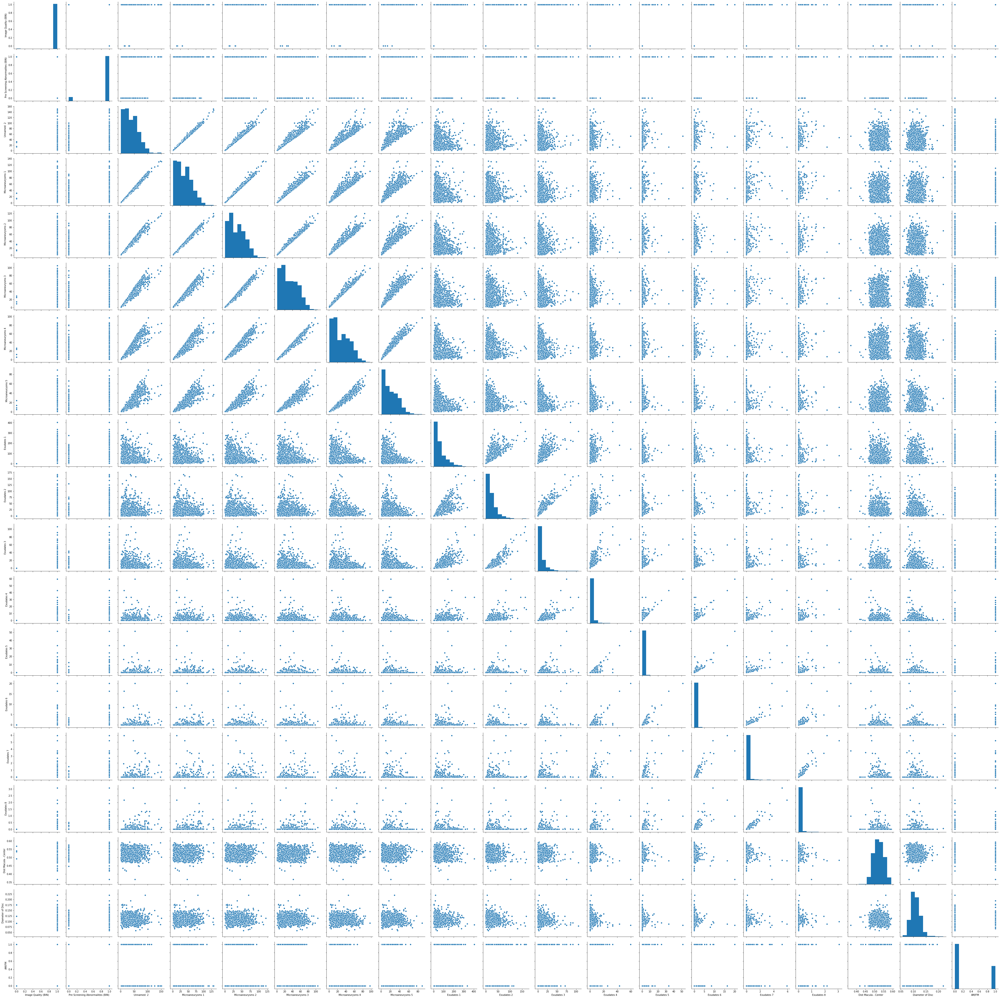

PairPlot Graph.
-This is the graph shows the dependence of the features in the data.

<IPython.core.display.Javascript object>


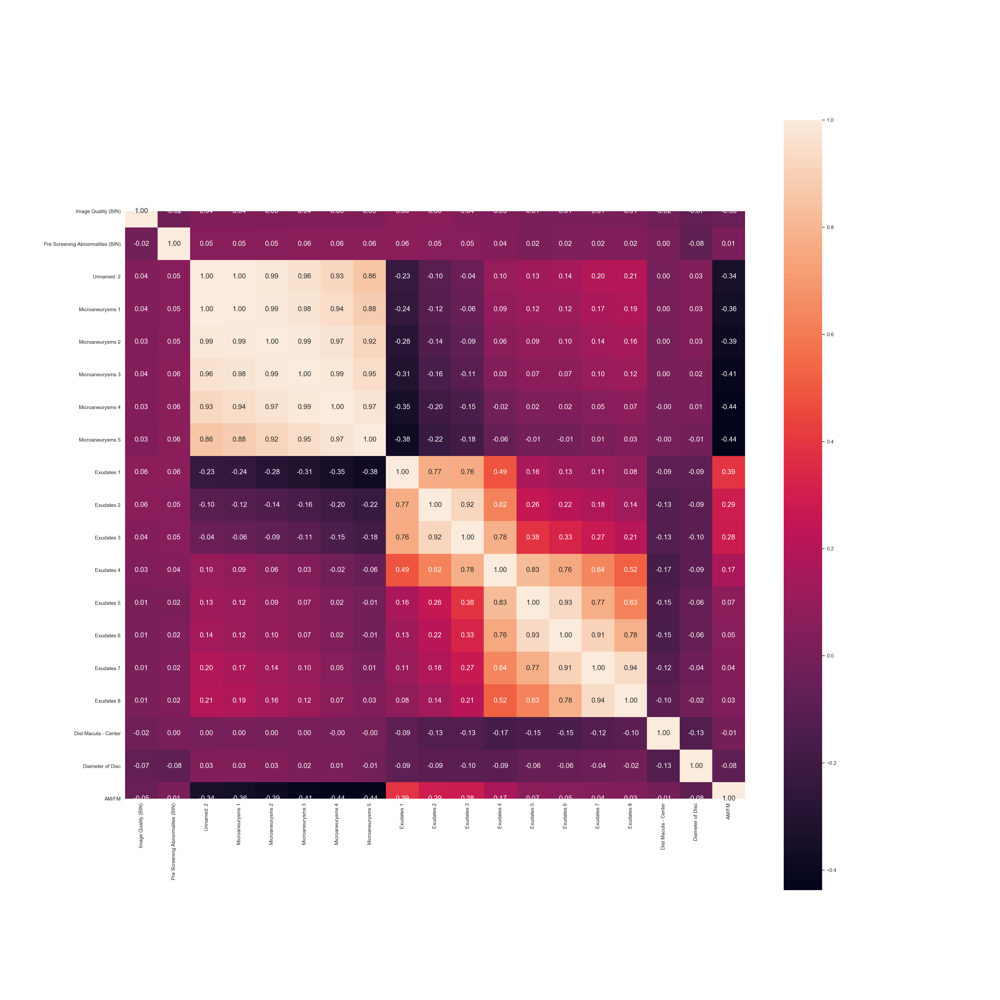

In [21]:
%matplotlib notebook
cm=np.corrcoef(X.values.T)
col_names=X.columns
sns.set(font_scale=1)
plt.figure(figsize=(30,30))
hm=sns.heatmap(cm,cbar=True,annot=True,square=True,fmt='.2f',
               annot_kws={'size':15},
               yticklabels=col_names,
               xticklabels=col_names)
plt.show()


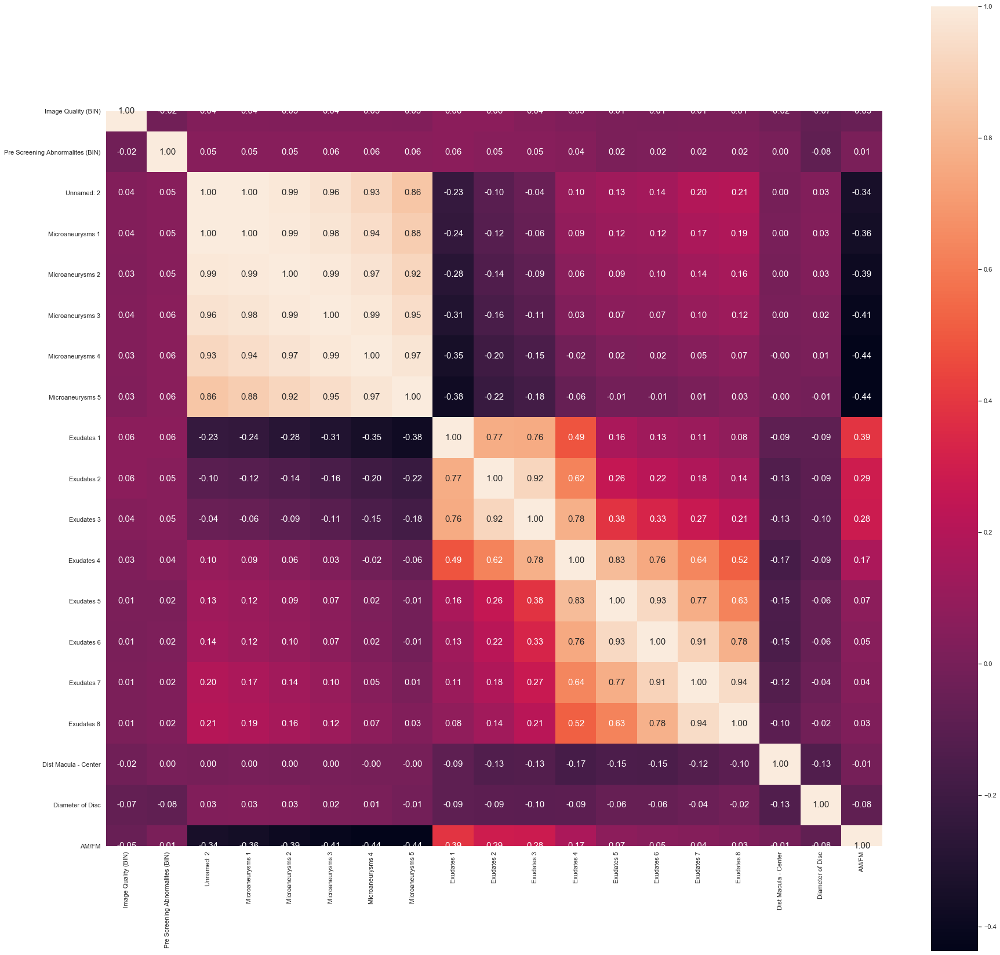
HeatMap:
- This Heatmap shows the check error of the features.

C:\Anaconda\envs\tensorenv\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


<IPython.core.display.Javascript object>


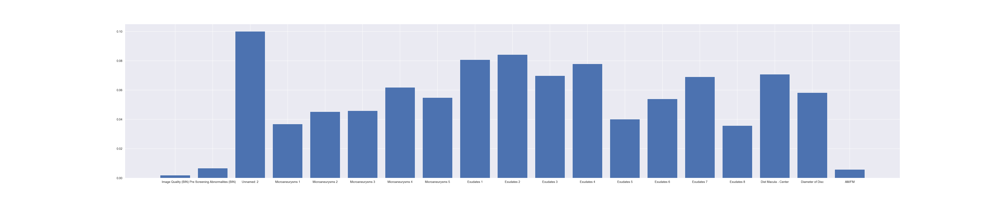

In [24]:
from sklearn.ensemble import RandomForestClassifier
%matplotlib notebook
rf=RandomForestClassifier()
rf.fit(X_train_sc,y_train_sc)
ypred_rf=rf.predict(X_test_sc)
fea_imp=(rf.feature_importances_)
plt.subplots(figsize=(50,10))
plt.bar(col_names,fea_imp)
plt.show()

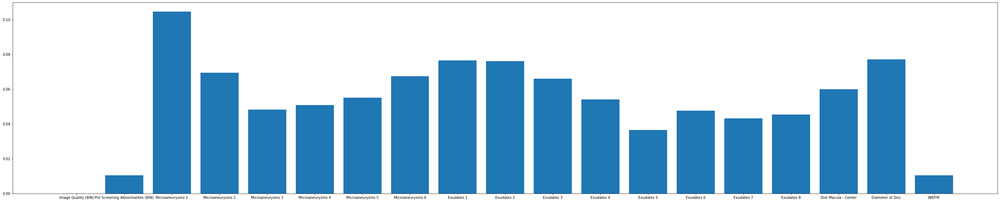

BarGraph:
- This Bargharp shows the contributiton of each of the Feature, That it contibutes to the fianl answer of the prediction.

- These are the Graphs that shows us the contribution of the features.
- The loss Functions
- These Graphs can be used in tunig the parameters more fine.
- EX: The graph shows that the dependece and the contibution of the Feature 1,i.e. Image Quality, Pre-Screening Abnormalities, And wehater the test is Done by AM/FM are Insignificant and can be removed.